Data Loading

In [43]:
%pip install pandas

Note: you may need to restart the kernel to use updated packages.


In [2]:
import pandas as pd
import numpy as np


In [3]:
df_crime=pd.read_csv("D:\\Projects\\crime_analyser\\Crime_Data.csv")


Data cleaning

In [46]:
df_crime.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 549999 entries, 0 to 549998
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    549999 non-null  int64  
 1   Case Number           549999 non-null  object 
 2   Date                  549999 non-null  object 
 3   Block                 549999 non-null  object 
 4   IUCR                  549999 non-null  object 
 5   Primary Type          549999 non-null  object 
 6   Description           549999 non-null  object 
 7   Location Description  548326 non-null  object 
 8   Arrest                549999 non-null  bool   
 9   Domestic              549999 non-null  bool   
 10  Beat                  549999 non-null  int64  
 11  District              549999 non-null  int64  
 12  Ward                  213674 non-null  float64
 13  Community Area        215093 non-null  float64
 14  FBI Code              549999 non-null  object 
 15  

In [49]:
df_crime.shape

(549999, 22)

In [50]:
df_crime.isna().sum()


ID                           0
Case Number                  0
Date                         0
Block                        0
IUCR                         0
Primary Type                 0
Description                  0
Location Description      1673
Arrest                       0
Domestic                     0
Beat                         0
District                     0
Ward                    336325
Community Area          334906
FBI Code                     0
X Coordinate              6912
Y Coordinate              6912
Year                         0
Updated On                   0
Latitude                  6912
Longitude                 6912
Location                  6912
dtype: int64

In [4]:
df_crime.head(5)

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,5741943,HN549294,25-08-2007 09:22,074XX N ROGERS AVE,560,ASSAULT,SIMPLE,OTHER,False,False,...,49.0,1.0,08A,NaN,NaN,2007,17-08-2015 15:03,NaN,NaN,NaN
1,25953,JE240540,24-05-2021 15:06,020XX N LARAMIE AVE,110,HOMICIDE,FIRST DEGREE MURDER,STREET,True,False,...,36.0,19.0,01A,1141387.0,1913179.0,2021,18-11-2023 15:39,41.917838,-87.755969,"(41.917838056, -87.755968972)"
2,26038,JE279849,26-06-2021 09:24,062XX N MC CORMICK RD,110,HOMICIDE,FIRST DEGREE MURDER,PARKING LOT,True,False,...,50.0,13.0,01A,1152781.0,1941458.0,2021,18-11-2023 15:39,41.995219,-87.713355,"(41.995219444, -87.713354912)"
3,13279676,JG507211,09-11-2023 07:30,019XX W BYRON ST,620,BURGLARY,UNLAWFUL ENTRY,APARTMENT,False,False,...,47.0,5.0,5,1162518.0,1925906.0,2023,18-11-2023 15:39,41.952345,-87.677975,"(41.952345086, -87.677975059)"
4,13274752,JG501049,12-11-2023 07:59,086XX S COTTAGE GROVE AVE,454,BATTERY,"AGGRAVATED P.O. - HANDS, FISTS, FEET, NO / MIN...",SMALL RETAIL STORE,True,False,...,6.0,44.0,08B,1183071.0,1847869.0,2023,09-12-2023 15:41,41.737751,-87.604856,"(41.737750767, -87.604855911)"


In [52]:
df_crime.drop_duplicates


<bound method DataFrame.drop_duplicates of               ID Case Number              Date                      Block  \
0        5741943    HN549294  25-08-2007 09:22         074XX N ROGERS AVE   
1          25953    JE240540  24-05-2021 15:06        020XX N LARAMIE AVE   
2          26038    JE279849  26-06-2021 09:24      062XX N MC CORMICK RD   
3       13279676    JG507211  09-11-2023 07:30           019XX W BYRON ST   
4       13274752    JG501049  12-11-2023 07:59  086XX S COTTAGE GROVE AVE   
...          ...         ...               ...                        ...   
549994   1715153     G516233  27-08-2001 23:00       036XX S LAKE PARK AV   
549995   1799889     G625392  16-10-2001 16:30         065XX S STEWART AV   
549996   1769834     G583569  29-09-2001 05:35    031XX N CENTRAL PARK AV   
549997   1788327     G610965  12-09-2001 09:05          065XX S CICERO AV   
549998   1810693     G627247  18-10-2001 17:34       053XX W FERDINAND ST   

        IUCR         Primary Typ

In [5]:
# Removing rows with null values in the specified columns
df_crime_final = df_crime.dropna(subset=['Latitude', 'Longitude', 'Location','X Coordinate','Y Coordinate','Location Description'])

In [6]:
df_crime_final.isna().sum()


ID                           0
Case Number                  0
Date                         0
Block                        0
IUCR                         0
Primary Type                 0
Description                  0
Location Description         0
Arrest                       0
Domestic                     0
Beat                         0
District                     0
Ward                    334384
Community Area          333061
FBI Code                     0
X Coordinate                 0
Y Coordinate                 0
Year                         0
Updated On                   0
Latitude                     0
Longitude                    0
Location                     0
dtype: int64

In [7]:
# drop the ward and community column the null value percentage was above 60 percent 
ward_null_percentage = df_crime_final['Ward'].isnull().mean() * 100
community_area_null_percentage = df_crime_final['Community Area'].isnull().mean() * 100
print(f"Percentage of null values in 'Ward': {ward_null_percentage:.2f}%")
print(f"Percentage of null values in 'Community Area': {community_area_null_percentage:.2f}%")

Percentage of null values in 'Ward': 61.70%
Percentage of null values in 'Community Area': 61.45%


In [8]:
 # droping the ward and community column
df_crime_data = df_crime_final.drop(columns=['Ward', 'Community Area'])


In [9]:
df_crime_data.isna().sum()

ID                      0
Case Number             0
Date                    0
Block                   0
IUCR                    0
Primary Type            0
Description             0
Location Description    0
Arrest                  0
Domestic                0
Beat                    0
District                0
FBI Code                0
X Coordinate            0
Y Coordinate            0
Year                    0
Updated On              0
Latitude                0
Longitude               0
Location                0
dtype: int64

In [10]:
df_crime_data.shape

(541984, 20)

In [11]:
df_crime_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 541984 entries, 1 to 549998
Data columns (total 20 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    541984 non-null  int64  
 1   Case Number           541984 non-null  object 
 2   Date                  541984 non-null  object 
 3   Block                 541984 non-null  object 
 4   IUCR                  541984 non-null  object 
 5   Primary Type          541984 non-null  object 
 6   Description           541984 non-null  object 
 7   Location Description  541984 non-null  object 
 8   Arrest                541984 non-null  bool   
 9   Domestic              541984 non-null  bool   
 10  Beat                  541984 non-null  int64  
 11  District              541984 non-null  int64  
 12  FBI Code              541984 non-null  object 
 13  X Coordinate          541984 non-null  float64
 14  Y Coordinate          541984 non-null  float64
 15  Year 

In [12]:
# Convert 'Date' and 'Updated On' to datetime with the correct format
df_crime_data['Date'] = pd.to_datetime(df_crime_data['Date'], format="%d-%m-%Y %H:%M")
df_crime_data['Updated On'] = pd.to_datetime(df_crime_data['Updated On'], format="%d-%m-%Y %H:%M")




In [19]:
df_crime_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 541984 entries, 1 to 549998
Data columns (total 24 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   ID                    541984 non-null  int64         
 1   Case Number           541984 non-null  object        
 2   Date                  541984 non-null  datetime64[ns]
 3   Block                 541984 non-null  object        
 4   IUCR                  541984 non-null  object        
 5   Primary Type          541984 non-null  object        
 6   Description           541984 non-null  object        
 7   Location Description  541984 non-null  object        
 8   Arrest                541984 non-null  bool          
 9   Domestic              541984 non-null  bool          
 10  Beat                  541984 non-null  int64         
 11  District              541984 non-null  int64         
 12  FBI Code              541984 non-null  object        
 13  X Co

In [18]:
# Create 'Year' column
df_crime_data['Year'] = df_crime_data['Date'].dt.year

# Create 'Hour' column
df_crime_data['Hour'] = df_crime_data['Date'].dt.hour

# Create 'Day of Week' column
df_crime_data['Day of Week'] = df_crime_data['Date'].dt.dayofweek  # Monday=0, Sunday=6

# Create 'Month' column
df_crime_data['Month'] = df_crime_data['Date'].dt.month

# Create 'Day' column
df_crime_data['Day'] = df_crime_data['Date'].dt.day

In [20]:
df_crime_data.shape

(541984, 24)

In [50]:
df_crime_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 541984 entries, 1 to 549998
Data columns (total 25 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   ID                    541984 non-null  int64         
 1   Case Number           541984 non-null  object        
 2   Date                  541984 non-null  datetime64[ns]
 3   Block                 541984 non-null  object        
 4   IUCR                  541984 non-null  object        
 5   Primary Type          541984 non-null  object        
 6   Description           541984 non-null  object        
 7   Location Description  541984 non-null  object        
 8   Arrest                541984 non-null  bool          
 9   Domestic              541984 non-null  bool          
 10  Beat                  541984 non-null  int64         
 11  District              541984 non-null  int64         
 12  FBI Code              541984 non-null  object        
 13  X Co

In [51]:
df_crime_data.columns


Index(['ID', 'Case Number', 'Date', 'Block', 'IUCR', 'Primary Type',
       'Description', 'Location Description', 'Arrest', 'Domestic', 'Beat',
       'District', 'FBI Code', 'X Coordinate', 'Y Coordinate', 'Year',
       'Updated On', 'Latitude', 'Longitude', 'Location', 'Hour',
       'Day of Week', 'Month', 'Day', 'Season'],
      dtype='object')

In [67]:
df_crime_data.to_csv("Chicago_Crimes.csv",index=False)


Exploratory Data Analysis (EDA)

In [14]:
import matplotlib as plt
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime

1. Temporal Analysis
Crime Trends Over Time: Examining how the number of crimes has changed over the years.

In [70]:
import plotly.graph_objs as go

# Grouping data by year and counting the number of crimes
crimes_per_year = df_crime_data['Year'].value_counts().sort_index()

# Creating a Plotly line plot for crimes per year
fig = go.Figure()
fig.add_trace(go.Scatter(x=crimes_per_year.index, y=crimes_per_year.values,
                         mode='lines+markers', marker=dict(color='blue'),
                         hovertemplate='<b>Year:</b> %{x}<br><b>Number of Crimes:</b> %{y}<extra></extra>'))
fig.update_layout(title='Number of Crimes Per Year',
                  xaxis_title='Year',
                  yaxis_title='Number of Crimes')
fig.show()

2. Crime Trends Over Time (Number of Crimes Per Month)

In [24]:
import plotly.graph_objs as go

# Grouping data by month and year, and counting the number of crimes
crimes_per_month = df_crime_data.groupby(['Year', 'Month']).size().reset_index(name='Count')

# Creating a Plotly line plot for crimes per month
fig = go.Figure()
for year in crimes_per_month['Year'].unique():
    data_year = crimes_per_month[crimes_per_month['Year'] == year]
    fig.add_trace(go.Scatter(x=data_year['Month'], y=data_year['Count'],
                             mode='lines+markers', name=str(year),
                             hovertemplate='<b>Month:</b> %{x}<br><b>Number of Crimes:</b> %{y}<extra></extra>'))
fig.update_layout(title='Number of Crimes Per Month',
                  xaxis_title='Month',
                  yaxis_title='Number of Crimes')

3. Peak Crime Hours (Number of Crimes Per Hour)

In [72]:
# Grouping data by hour of the day and counting the number of crimes
crimes_per_hour = df_crime_data['Hour'].value_counts().sort_index()

# Creating a Plotly bar plot for crimes per hour
fig = go.Figure()
fig.add_trace(go.Bar(x=crimes_per_hour.index, y=crimes_per_hour.values,
                     marker=dict(color='blue')))
fig.update_layout(title='Number of Crimes Per Hour',
                  xaxis_title='Hour of the Day',
                  yaxis_title='Number of Crimes')
fig.show()

4. Crime Trends Over Time (Number of Crimes Per Day of the Week)

In [74]:
import plotly.graph_objects as go

# Group data by day of the week and count the number of crimes
crimes_per_day = df_crime_data['Day of Week'].value_counts().reset_index()
crimes_per_day.columns = ['Day of Week', 'Crime Count']

# Sort days of the week in chronological order
days_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
crimes_per_day = crimes_per_day.sort_values('Day of Week', key=lambda x: pd.Categorical(x, categories=days_order, ordered=True))

# Create a line chart for crimes per day of the week
fig = go.Figure(data=[
    go.Scatter(x=crimes_per_day['Day of Week'], y=crimes_per_day['Crime Count'], mode='lines+markers')
])

fig.update_layout(
    title='Number of Crimes Per Day of the Week',
    xaxis_title='Day of the Week',
    yaxis_title='Number of Crimes'
)

fig.show()

2. Geospatial Analysis
Crime Hotspots Map

In [75]:
%pip install folium

In [25]:
import folium
from folium.plugins import HeatMap

# Create a base map centered around Chicago
chicago_map = folium.Map(location=[41.8781, -87.6298], zoom_start=11)

# Extract latitude and longitude coordinates
crime_locations = df_crime_data[['Latitude', 'Longitude']].values.tolist()

# Add heatmap layer to the map
HeatMap(crime_locations, radius=10).add_to(chicago_map)

# Display the map
chicago_map

District/Ward Analysis


In [30]:
import plotly.graph_objects as go

# Group data by ward and count the number of crimes
ward_crime_counts = df_crime_data['District'].value_counts().reset_index()
ward_crime_counts.columns = ['District', 'Crime Count']

# Create a bar chart for crimes per ward
fig = go.Figure(go.Bar(
    x=ward_crime_counts['District'],
    y=ward_crime_counts['Crime Count'],
    marker=dict(color='blue'),  # Adjust color if needed
))

fig.update_layout(
    title='Crimes Per District',
    xaxis_title='District',
    yaxis_title='Number of Crimes',
)

fig.show()

3. Crime Type Analysis

Distribution of Crime Types

In [29]:
import plotly.graph_objects as go

# Assuming you have a DataFrame 'df_crime_data' with a column 'Primary Type' representing the primary type of each crime

# Count the frequency of each crime type
crime_type_counts = df_crime_data['Primary Type'].value_counts().reset_index()
crime_type_counts.columns = ['Crime Type', 'Crime Count']

# Sort the DataFrame by crime count in descending order
crime_type_counts = crime_type_counts.sort_values(by='Crime Count', ascending=False)

# Create a line graph for the distribution of crime types
fig = go.Figure()
fig.add_trace(go.Scatter(x=crime_type_counts['Crime Type'], y=crime_type_counts['Crime Count'], mode='lines+markers'))

fig.update_layout(
    title='Distribution of Crime Types',
    xaxis_title='Crime Type',
    yaxis_title='Crime Count',
    height=800 
)

fig.show()

Severity Analysis

In [33]:
import plotly.graph_objects as go

# List of severe crimes
severe_crimes = ['HOMICIDE', 'CRIMINAL SEXUAL ASSAULT', 'OFFENSE INVOLVING CHILDREN', 
                 'ROBBERY', 'ASSAULT', 'SEX OFFENSE', 'WEAPONS VIOLATION', 
                 'KIDNAPPING', 'ARSON', 'HUMAN TRAFFICKING', 'CRIM SEXUAL ASSAULT', 
                 'DOMESTIC VIOLENCE']

# List of less severe crimes
less_severe_crimes = ['BURGLARY', 'BATTERY', 'CRIMINAL DAMAGE', 'DECEPTIVE PRACTICE', 
                      'THEFT', 'MOTOR VEHICLE THEFT', 'OTHER OFFENSE', 'STALKING', 
                      'CRIMINAL TRESPASS', 'PROSTITUTION', 'NARCOTICS', 
                      'CONCEALED CARRY LICENSE VIOLATION', 'INTERFERENCE WITH PUBLIC OFFICER', 
                      'PUBLIC PEACE VIOLATION', 'OBSCENITY', 'LIQUOR LAW VIOLATION', 
                      'INTIMIDATION', 'GAMBLING', 'OTHER NARCOTIC VIOLATION', 'NON-CRIMINAL', 
                      'PUBLIC INDECENCY', 'RITUALISM', 'NON-CRIMINAL (SUBJECT SPECIFIED)', 
                      'NON - CRIMINAL']

# Count the frequency of severe and less severe crimes
severe_count = sum(df_crime_data['Primary Type'].isin(severe_crimes))
less_severe_count = sum(df_crime_data['Primary Type'].isin(less_severe_crimes))

# Create hover text for each category
hover_text_severe = f'Severe Crimes:<br>{"<br>".join(severe_crimes)}'
hover_text_less_severe = f'Less Severe Crimes:<br>{"<br>".join(less_severe_crimes)}'

# Create a donut chart for the distribution of crimes by severity
labels = ['Severe', 'Less Severe']
values = [severe_count, less_severe_count]
hover_text = [hover_text_severe, hover_text_less_severe]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, hole=.4, hovertext=hover_text, hoverinfo='text')])
fig.update_traces(textinfo='label+percent', insidetextorientation='radial')

fig.update_layout(title='Distribution of Crimes by Severity',height=500)
fig.update_layout(hoverlabel=dict(font=dict(size=8)))
fig.show()

4. Arrest and Domestic Incident Analysis


Arrest Rates Analysis

In [34]:
import plotly.graph_objects as go

# Calculate arrest rates by crime type
arrest_rates = df_crime_data.groupby('Primary Type')['Arrest'].mean().sort_values(ascending=False).reset_index()

# Create a bar chart for arrest rates
fig_arrest_rates = go.Figure(data=[
    go.Bar(
        x=arrest_rates['Primary Type'],
        y=arrest_rates['Arrest'] * 100,  # Convert to percentage
        text=arrest_rates['Arrest'] * 100,
        textposition='auto'
    )
])

fig_arrest_rates.update_layout(
    title='Arrest Rates by Crime Type',
    xaxis_title='Crime Type',
    yaxis_title='Arrest Rate (%)',
    xaxis_tickangle=-45,
    height=600
)

fig_arrest_rates.show()

Domestic vs. Non-Domestic Crimes Analysis

In [35]:
# Calculate the number of domestic vs. non-domestic crimes
domestic_counts = df_crime_data['Domestic'].value_counts()

# Create a pie chart for domestic vs. non-domestic crimes
fig_domestic = go.Figure(data=[
    go.Pie(
        labels=['Non-Domestic', 'Domestic'],
        values=[domestic_counts[False], domestic_counts[True]],
        hole=.3,
        hoverinfo='label+percent+value'
    )
])

fig_domestic.update_layout(
    title='Domestic vs. Non-Domestic Crimes'
)

fig_domestic.show()

Detailed Analysis of Domestic vs. Non-Domestic Crimes

In [36]:
import plotly.graph_objects as go

# Calculate the distribution of crime types for domestic vs. non-domestic incidents
domestic_crime_types = df_crime_data[df_crime_data['Domestic'] == True]['Primary Type'].value_counts().reset_index()
domestic_crime_types.columns = ['Primary Type', 'Domestic Count']

non_domestic_crime_types = df_crime_data[df_crime_data['Domestic'] == False]['Primary Type'].value_counts().reset_index()
non_domestic_crime_types.columns = ['Primary Type', 'Non-Domestic Count']

# Merge the dataframes for comparison
domestic_comparison = domestic_crime_types.merge(non_domestic_crime_types, on='Primary Type', how='outer').fillna(0)

# Create a bar chart for domestic vs. non-domestic crime types
fig_domestic_comparison = go.Figure(data=[
       go.Bar(x=domestic_comparison['Primary Type'],
        y=domestic_comparison['Domestic Count'],
        name='Domestic'),

      go.Bar( x=domestic_comparison['Primary Type'],
        y=domestic_comparison['Non-Domestic Count'],
        name='Non-Domestic')])

fig_domestic_comparison.update_layout(
  title='Crime Types: Domestic vs. Non-Domestic',
  xaxis_title='Crime Type',
   yaxis_title='Number of Crimes',
   barmode='group',
   xaxis_tickangle=-45,
    height=800)

fig_domestic_comparison.show()

Location-Specific Analysis


Location Description Analysis

In [37]:
import plotly.graph_objects as go

# Calculate the most common locations for crimes
location_counts = df_crime_data['Location Description'].value_counts().head(30).reset_index()
location_counts.columns = ['Location Description', 'Crime Count']

# Create a horizontal bar chart for the most common crime locations
fig_location_counts = go.Figure(data=[
    go.Bar(
        x=location_counts['Crime Count'],
        y=location_counts['Location Description'],
        orientation='h',
        text=location_counts['Crime Count'],
        textposition='auto'
    )
])

fig_location_counts.update_layout(
    title='Top 30 Most Common Locations for Crimes',
    xaxis_title='Number of Crimes',
    yaxis_title='Location Description',
    height=600
)

fig_location_counts.show()

Top crime types Analysis by Locations 

In [38]:
import plotly.express as px

# Limit the number of crime types and locations for readability
top_locations = df_crime_data['Location Description'].value_counts().head(30).index
top_crime_types = df_crime_data['Primary Type'].value_counts().head(10).index

# Filter the data to include only the top locations and crime types
filtered_data = df_crime_data[df_crime_data['Location Description'].isin(top_locations) & df_crime_data['Primary Type'].isin(top_crime_types)]

# Calculate the number of different crime types by location
location_crime_types = filtered_data.groupby(['Location Description', 'Primary Type']).size().reset_index(name='Crime Count')

# A heatmap for crime types by location
fig_location_crime_types = px.density_heatmap(
    location_crime_types,
    x='Location Description',
    y='Primary Type',
    z='Crime Count',
    title='Top 30 Crime Types by Top 30 Locations',
    color_continuous_scale='Viridis'
)

fig_location_crime_types.update_layout(
    xaxis_tickangle=-45,
    height=600
)

fig_location_crime_types.show()

Comparison by Beat


C:\Users\abina\AppData\Local\Temp\ipykernel_12612\4079296800.py:4: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




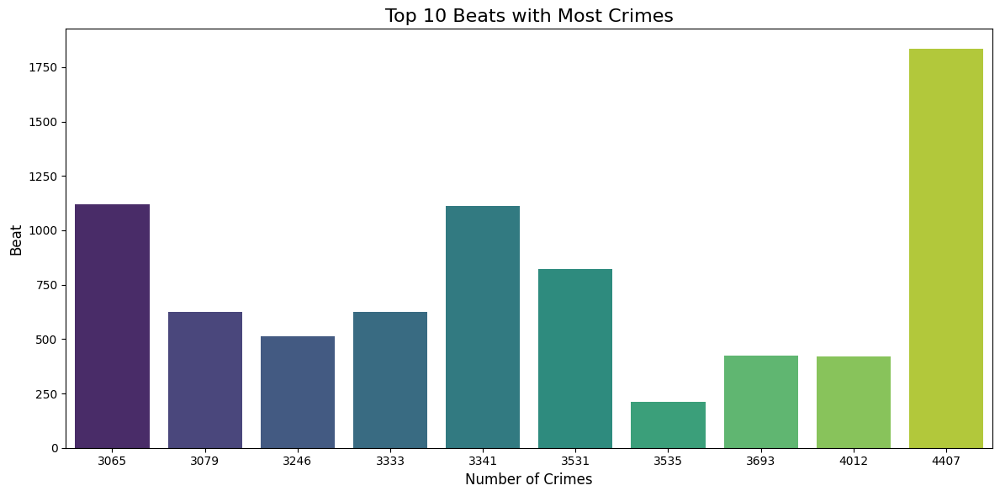

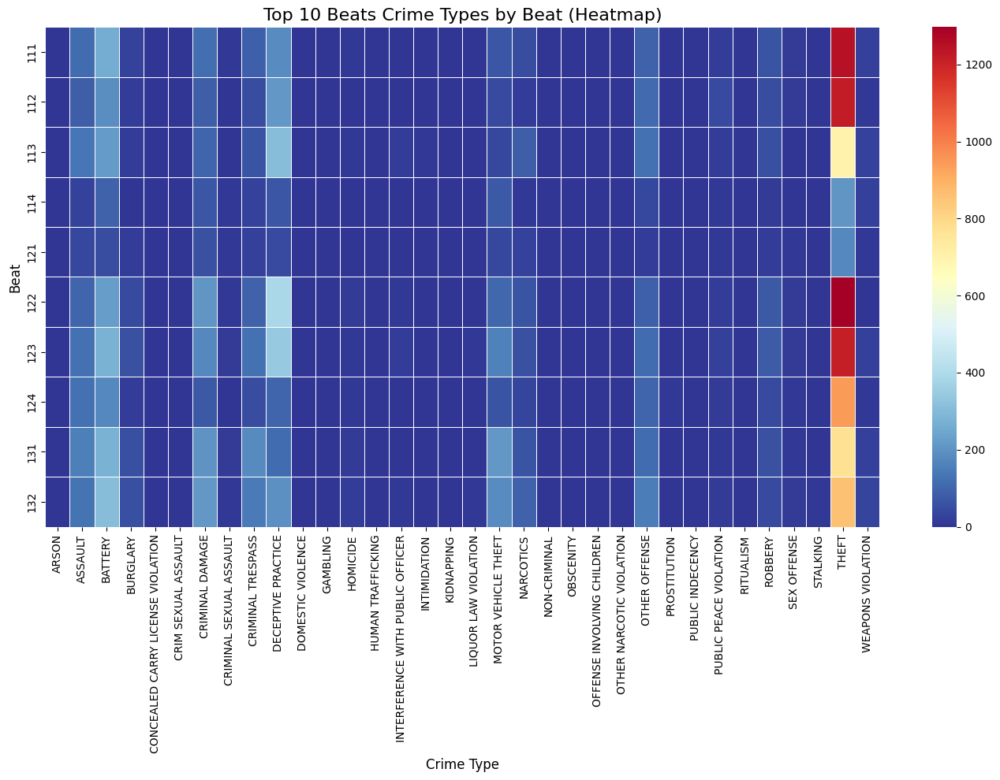

In [35]:

# Top 10 Beats with Most Crimes
beat_crime_counts = df_crime_data['Beat'].value_counts().head(10)
plt.figure(figsize=(12, 6))
sns.barplot(x=beat_crime_counts.values,y=beat_crime_counts.index,palette="viridis")
plt.title("Top 10 Beats with Most Crimes", fontsize=16)
plt.xlabel("Number of Crimes", fontsize=12)
plt.ylabel("Beat", fontsize=12)
plt.tight_layout()
plt.show()

# Top 10 Beats Crime Types with Crime Count by Beat
beat_crime_types = df_crime_data.groupby(['Beat', 'Primary Type']).size().unstack(fill_value=0).head(10)
plt.figure(figsize=(14, 10))
sns.heatmap(beat_crime_types,cmap="RdYlBu_r",linewidths=0.5,linecolor='white')
plt.title("Top 10 Beats Crime Types by Beat (Heatmap)", fontsize=16)
plt.xlabel("Crime Type", fontsize=12)
plt.ylabel("Beat", fontsize=12)
plt.tight_layout()
plt.show()

Seasonal and Weather Impact

Seasonal Trends

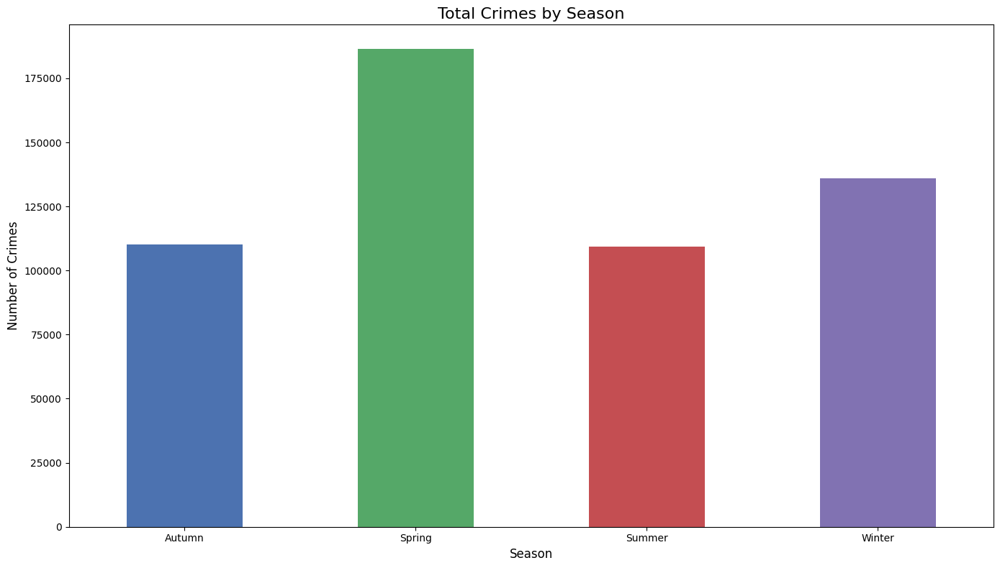

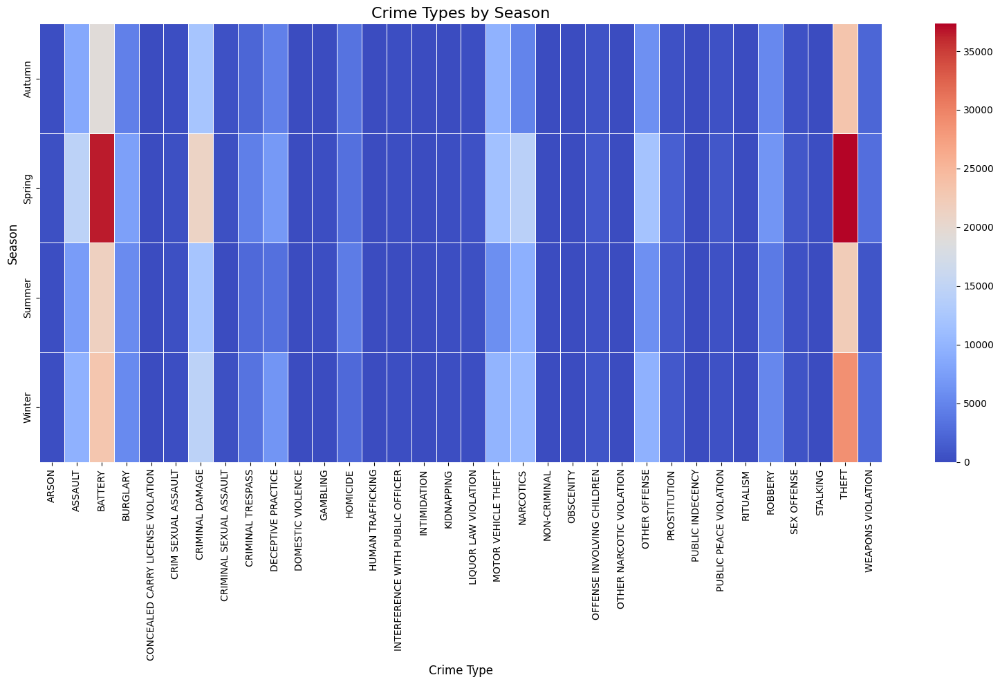

In [36]:

def get_season(month):
    if month in [12, 1, 2]:
        return 'Winter'
    elif month in [3, 4, 5]:
        return 'Spring'
    elif month in [6, 7, 8]:
        return 'Summer'
    else:
        return 'Autumn'
df_crime_data['Season'] = df_crime_data['Month'].apply(get_season)

# Crime Count by Season
seasonal_crime_data = df_crime_data.groupby(['Season', 'Primary Type']).size().unstack(fill_value=0)
plt.figure(figsize=(14, 8))
seasonal_crime_data.sum(axis=1).plot(kind='bar', color=['#4c72b0', '#55a868', '#c44e52', '#8172b2'])
plt.title('Total Crimes by Season', fontsize=16)
plt.xlabel('Season', fontsize=12)
plt.ylabel('Number of Crimes', fontsize=12)
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

# Crime Type by Season
plt.figure(figsize=(16, 10))
sns.heatmap(seasonal_crime_data, cmap="coolwarm", annot=False, fmt='d', linewidths=0.5)
plt.title('Crime Types by Season', fontsize=16)
plt.xlabel('Crime Type', fontsize=12)
plt.ylabel('Season', fontsize=12)
plt.tight_layout()
plt.show()

Repeat Offenders

Repeat Crime Locations

C:\Users\abina\AppData\Local\Temp\ipykernel_12612\1536219162.py:5: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




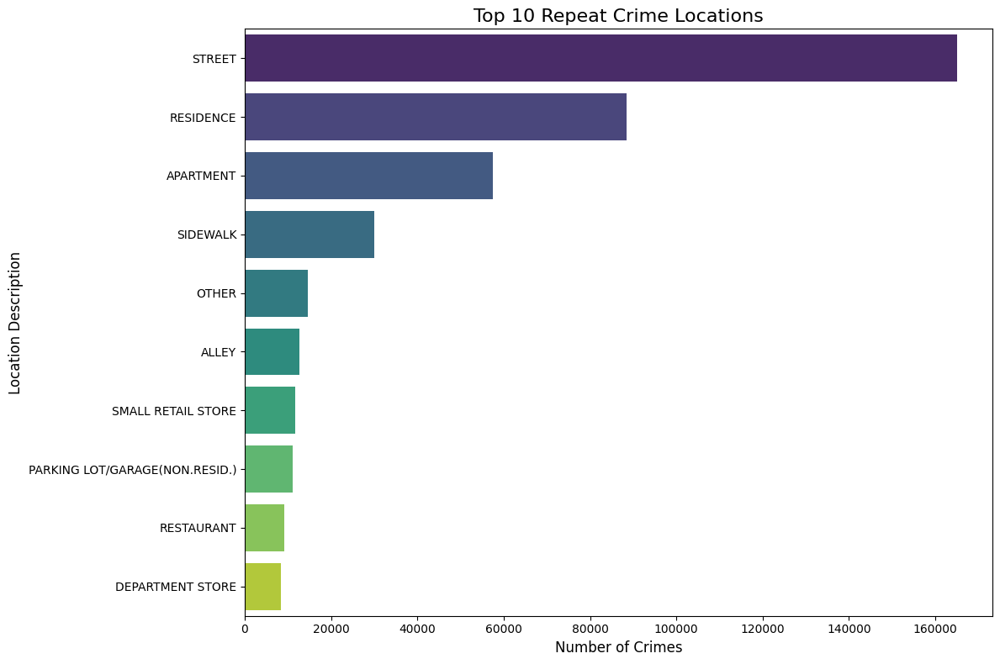

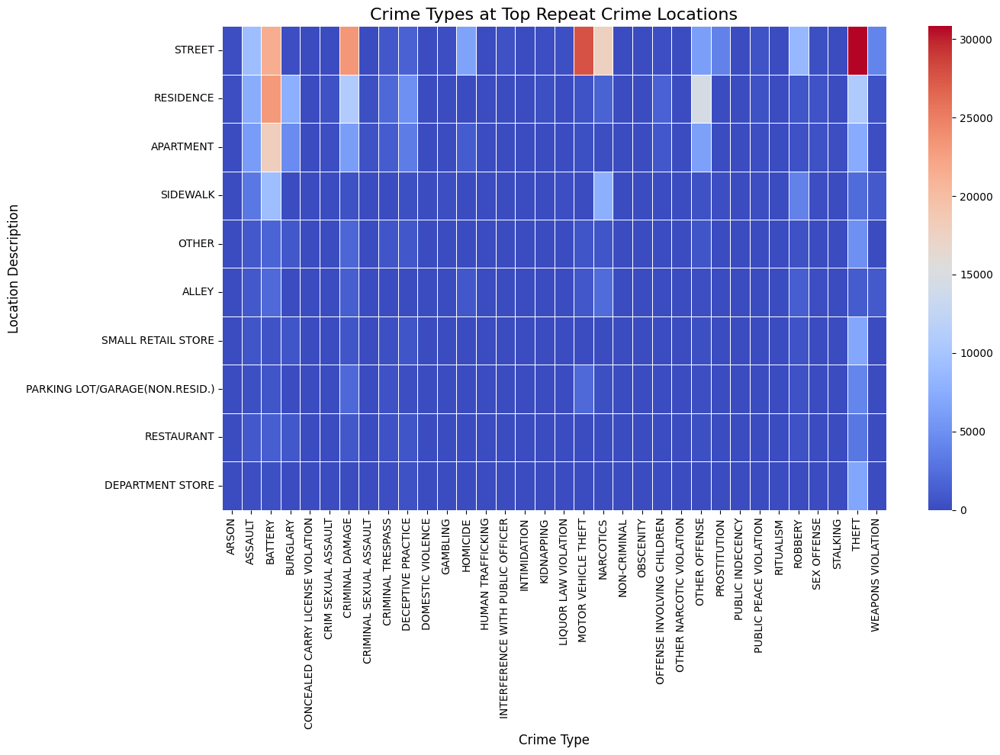

In [37]:
# Repeat Crime Locations
location_counts = df_crime_data.groupby('Location Description')['ID'].count().sort_values(ascending=False)
top_locations = location_counts.head(10)
plt.figure(figsize=(12, 8))
sns.barplot(x=top_locations.values, y=top_locations.index, palette="viridis")
plt.title("Top 10 Repeat Crime Locations", fontsize=16)
plt.xlabel("Number of Crimes", fontsize=12)
plt.ylabel("Location Description", fontsize=12)
plt.tight_layout()
plt.show()

# Crime Types at Top Locations
repeat_locations_crime_type = df_crime_data.groupby(['Location Description', 'Primary Type']).size().unstack(fill_value=0)
top_repeat_locations = repeat_locations_crime_type.loc[top_locations.index]
plt.figure(figsize=(14, 10))
sns.heatmap(top_repeat_locations, cmap="coolwarm", linewidths=0.5, annot=False, fmt='d')
plt.title("Crime Types at Top Repeat Crime Locations", fontsize=16)
plt.xlabel("Crime Type", fontsize=12)
plt.ylabel("Location Description", fontsize=12)
plt.tight_layout()
plt.show()

Recidivism

Recidivism Rates


C:\Users\abina\AppData\Local\Temp\ipykernel_12612\4234474814.py:7: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




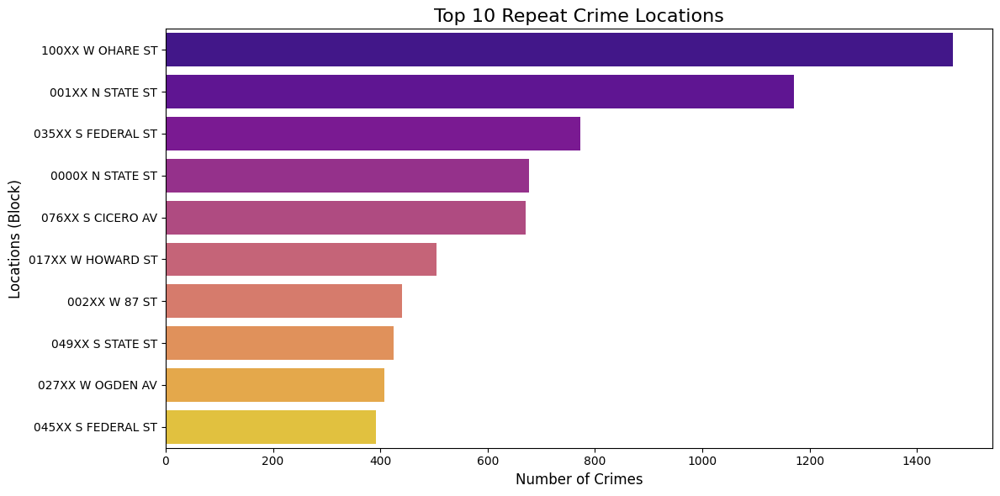

Recidivism Rate: 0.09%
Recidivism Rate: 0.09%



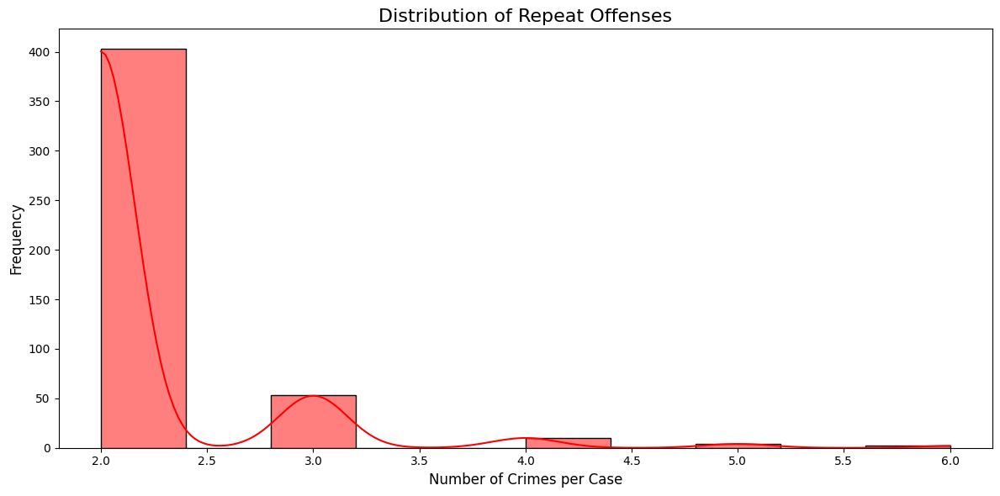

In [38]:
# Top 10 Repeat Crime Locations (Block)
repeat_locations = df_crime_data.groupby('Block').size().reset_index(name='Crime Count')
# Locations with more than one crime
repeat_locations = repeat_locations[repeat_locations['Crime Count'] > 1].sort_values(by='Crime Count', ascending=False)

plt.figure(figsize=(12, 6))
sns.barplot(x='Crime Count', y='Block', data=repeat_locations.head(10), palette="plasma")
plt.title("Top 10 Repeat Crime Locations", fontsize=16)
plt.xlabel("Number of Crimes", fontsize=12)
plt.ylabel("Locations (Block)", fontsize=12)
plt.tight_layout()
plt.show()

crime_cases = df_crime_data.groupby('Case Number').size().reset_index(name='Occurrences')
repeat_cases = crime_cases[crime_cases['Occurrences'] > 1]
recidivism_rate = (len(repeat_cases) / len(crime_cases)) * 100
print(f"Recidivism Rate: {recidivism_rate:.2f}%")

# Recidivism Analysis
crime_cases = df_crime_data.groupby('Case Number').size().reset_index(name='Occurrences')
repeat_cases = crime_cases[crime_cases['Occurrences'] > 1]
# Calculate Recidivism Rate
recidivism_rate = (len(repeat_cases) / len(crime_cases)) * 100
print(f"Recidivism Rate: {recidivism_rate:.2f}%")
print("")

# Distribution of Repeat Cases
plt.figure(figsize=(12, 6))
sns.histplot(repeat_cases['Occurrences'], bins=10, kde=True, color='red')
plt.title("Distribution of Repeat Offenses", fontsize=16)
plt.xlabel("Number of Crimes per Case", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.tight_layout()
plt.show()

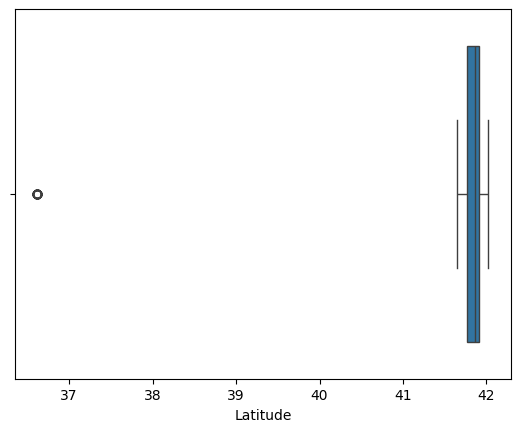

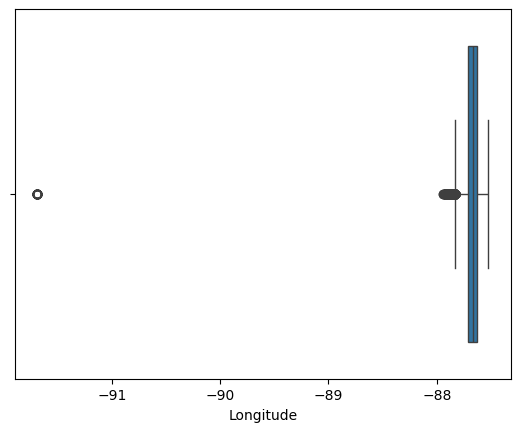

In [44]:
import seaborn as sns
import matplotlib.pyplot as plt

# Boxplot for 'Latitude' and 'Longitude' to identify outliers
sns.boxplot(x=df_crime_data['Latitude'])
plt.show()
sns.boxplot(x=df_crime_data['Longitude'])
plt.show()